<a href="https://colab.research.google.com/github/shubhamkumar0/FoodWars/blob/main/foodwars.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import io
from google.colab import files
import warnings
warnings.simplefilter('ignore')
# upload the data set from local storage
uploaded = files.upload()

Saving IndianFoodDatasetCSV.csv to IndianFoodDatasetCSV (1).csv


In [3]:
# reading the file into a pandas dataframe
df = pd.read_csv(io.BytesIO(uploaded['IndianFoodDatasetCSV.csv']))
print(df.head())

   Srno  ...                                                URL
0     1  ...  https://www.archanaskitchen.com/masala-karela-...
1     2  ...  http://www.archanaskitchen.com/spicy-tomato-ri...
2     3  ...  http://www.archanaskitchen.com/ragi-vermicelli...
3     4  ...  http://www.archanaskitchen.com/gongura-chicken...
4     5  ...  https://www.archanaskitchen.com/andhra-style-a...

[5 rows x 15 columns]


In [4]:
# saving the necessary columns into a different DF
_df = df[['TranslatedIngredients']]
print(_df.head())

                               TranslatedIngredients
0  6 Karela (Bitter Gourd/ Pavakkai) - deseeded,S...
1  2-1 / 2 cups rice - cooked, 3 tomatoes, 3 teas...
2  1-1/2 cups Rice Vermicelli Noodles (Thin),1 On...
3  500 grams Chicken,2 Onion - chopped,1 Tomato -...
4  1 tablespoon chana dal, 1 tablespoon white ura...


In [5]:
# converting recipe string into list of strings separated by commas
_df['TranslatedIngredients'] = _df['TranslatedIngredients'].str.split(',')

In [6]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
stop = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [7]:
import re
from nltk.stem import PorterStemmer
stemming = PorterStemmer()

def identify_tokens(row):
    # tokenizing each sentence
    tokens = nltk.word_tokenize(row)
    # removing non english characters
    token_words = [w for w in tokens if w.isalpha() and not re.findall("[^\u0000-\u05C0\u2100-\u214F]+", w)]
    # removing stop words and doing stemming
    meaningful_words = [w.lower() for w in token_words if not w.lower() in stop]
    # meaningful_words = [stemming.stem(word) for word in meaningful_words]
    return (meaningful_words)

In [8]:
# remove these customized words to bring out the ingredients names better
personalised_stop_set = {'tablespoon', 'teaspoon', 'taste', 'gram', 'dry', 
                         'wet', 'powder', 'sliced', 'diced', 'cup', 'chopped', 
                         'grated', 'finely', 'tsp', 'small', 'inch', 'cut', 
                         'thinly', 'thin', 'tablespoons', 'teaspoons', 'pinch', 
                         'slit', 'soaked', 'minced', 'fine', 'overnight', 
                         'pieces', 'ssp', 'garnish', 'masala', 'required', 
                         'extracted', 'pieces', 'sized', 'kg', 'made', 'beaten',
                         'cups', 'fresh', 'grams', '', 'topping', 'halved', 
                         'adjust', 'topping', 'pounded', 'cooked', 'cook', 
                         'according', 'prepare', 'per', 'raw', 'cubes', 'washed',
                         'roughly', 'drained', 'ml', 'steamed','ground' ,'paste',
                         'roasted', 'garnishing', 'dried', 'cleaned', 'sprig', 
                         'boiled', 'peeled', 'junks', 'preference', 'water',
                         'size', 'split', 'temperature', 'essence', 'room',
                         'cooking', 'size', 'hours', 'split', 'size', 'tightly',
                         'packed', 'diagonally', 'within', 'spoon', 'tbsp', 'gm'}

def remove_my_stops(my_list):
    meaningful_words = [w for w in my_list if not w in personalised_stop_set]
    return (meaningful_words)

In [9]:
# preprocessing the data using the above helper functions
i=0
list_list_item = []
for row in _df['TranslatedIngredients']:
  item_list = []
  if type(row) is list:
    for each in row:
      item = identify_tokens(each)
      _item = remove_my_stops(item)
      item_str = ' '.join([str(elem) for elem in _item])
      if(len(item_str)!=0):
        item_str = item_str.replace(',', ' ')
        item_list.append(item_str)
    _df['TranslatedIngredients'][i] = item_list
    # to get a list of lists of string
    list_list_item.append(item_list)
    i = i+1

In [10]:
import multiprocessing
from gensim.models import Word2Vec, KeyedVectors
# to run word2vec in parallel, finding the number of cores
cores = multiprocessing.cpu_count()
sent = [row for row in _df['TranslatedIngredients']]
sent[:2]

[['karela bitter pavakkai deseeded',
  'salt',
  'onion',
  'flour besan',
  'turmeric haldi',
  'red chilli',
  'cumin seeds jeera',
  'coriander dhania',
  'amchur mango',
  'sunflower oil'],
 ['rice',
  'tomatoes',
  'bc belle bhat',
  'salt',
  'chickpea lentils',
  'cumin seeds',
  'white urad dal',
  'mustard',
  'green chilli',
  'red chilli',
  'cashew peanuts',
  'oil asafoetida']]

In [11]:
import gensim.downloader as api
model_glove_twitter = api.load("glove-twitter-50")
model_wiki_50 = api.load("glove-wiki-gigaword-50")

In [12]:
import umap
# let's define our model
# checkout the parameters here: https://radimrehurek.com/gensim/models/word2vec.html
model = Word2Vec(size=50, min_count=1, workers=cores-1, sg=1)


In [13]:
model.build_vocab(sent)
train_ex_cnt = model.corpus_count
model.build_vocab([list(model_wiki_50.vocab.keys())], update=True)
model.train(sent, total_examples=train_ex_cnt, epochs=model.iter)
model.save("word2vec.model")

In [ ]:
from gensim.models import Word2Vec
import umap
model = Word2Vec.load("word2vec.model")
X = model[model.wv.vocab]

cluster_embedding = umap.UMAP(n_neighbors=30, min_dist=0.0,
                              n_components=2, random_state=42).fit_transform(X)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  after removing the cwd from sys.path.


In [ ]:
# determine the odd one out
print(model.wv.doesnt_match(["pomegranate", "apple", "brinjal"]))

In [ ]:
# determine what goes with all the ingredients
def common_ingreds(l):
  vec = []
  for each in l:
    try:
      vec.append(model[each])
    except KeyError:
      continue
  return model.similar_by_vector(vec, topn=10)

common_ingreds(["radish", "brinjal"])

In [ ]:
# google_wv = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
import gensim.downloader as api
model_glove_twitter = api.load("glove-twitter-25")


In [ ]:
model_glove_twitter.vocab.keys()

dict_keys(['<user>', '.', ':', 'rt', ',', '<repeat>', '<hashtag>', '<number>', '<url>', '!', 'i', 'a', '"', 'the', '?', 'you', 'to', '(', '<allcaps>', '<elong>', ')', 'me', 'de', '<smile>', '！', 'que', 'and', '。', '-', 'my', 'no', '、', 'is', 'it', '…', 'in', 'n', 'for', '/', 'of', 'la', "'s", '*', 'do', "n't", 'that', 'on', 'y', "'", 'e', 'o', 'u', 'en', 'this', 'el', 'so', 'be', "'m", 'with', 'just', '>', 'your', '^', 'like', 'have', 'te', 'at', '？', 'love', 'se', 'are', '<', 'm', 'r', 'if', 'all', 'b', '・', 'not', 'but', 'we', 'es', 'ya', '&', 'follow', 'up', 'what', 'get', 'lol', 'un', '♥', 'lo', 'when', 'was', '“', '”', 'one', 'por', 'si', 'out', '_', 'mi', 'can', '<sadface>', 'من', '♡', '´', 'he', 'con', 'they', 'now', 'go', '،', 'para', 'los', 'know', 'haha', 'good', 'tu', 'back', '~', 'about', 'new', ';', 'as', 'day', 'how', 'who', 'will', 'want', 'people', 'yo', 'eu', 'from', 'di', 'time', '<heart>', 's', 'aku', 'da', "'re", '<lolface>', 'una', 'got', 'las', 'more', 'x', 'she',

In [ ]:
# import numpy as np

# def display_closestwords_tsnescatterplot(model, word, size):
    
#   arr = np.empty((0,size), dtype='f')
#   word_labels = [word]
#   close_words = model.wv.most_similar(positive=[word], topn=20)
#   arr = np.append(arr, np.array([model[word]]), axis=0)
#   for wrd_score in close_words:
#     wrd_vector = model[wrd_score[0]]
#     word_labels.append(wrd_score[0])
#     arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
#   tsne = TSNE(n_components=2, random_state=0)
#   np.set_printoptions(suppress=True)
#   Y = tsne.fit_transform(arr)
#   x_coords = Y[:, 0]
#   y_coords = Y[:, 1]
#   plt.scatter(x_coords, y_coords)
#   for label, x, y in zip(word_labels, x_coords, y_coords):
#     plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
#     plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
#     plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
#     plt.show()

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.


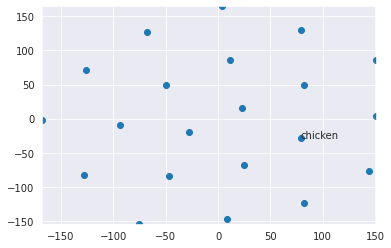

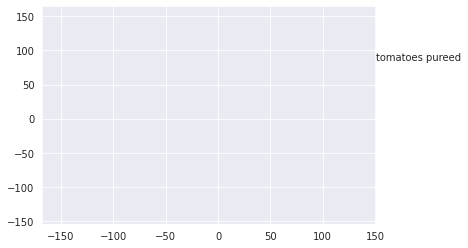

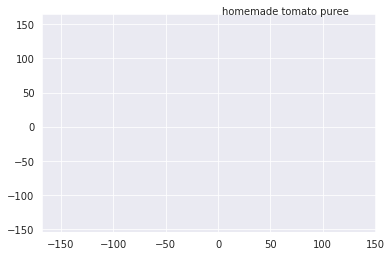

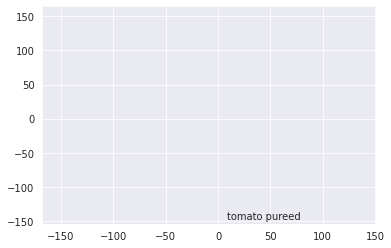

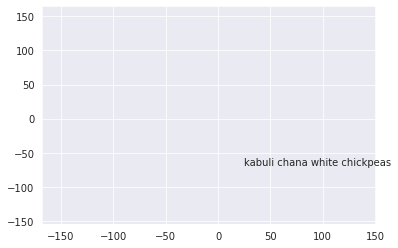

...

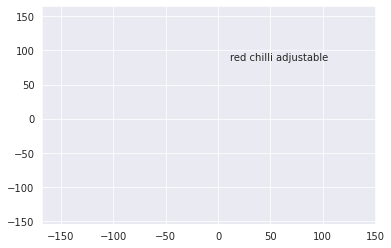

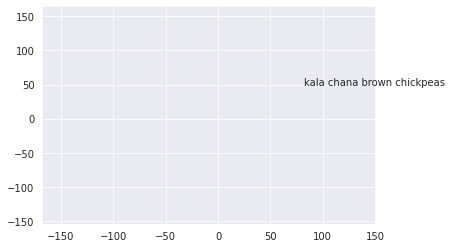

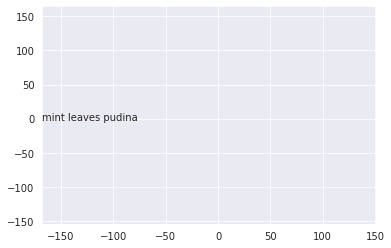

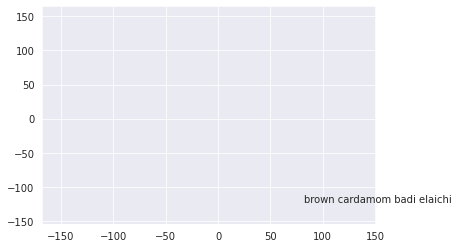

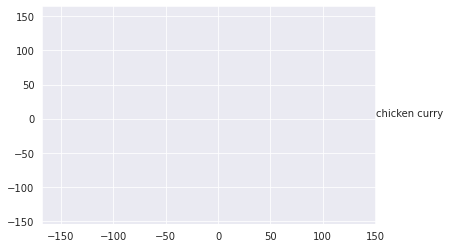

In [ ]:
# from sklearn.manifold import TSNE
# import matplotlib.pyplot as plt
# %matplotlib inline
# import seaborn as sns
# sns.set_style("darkgrid")

# display_closestwords_tsnescatterplot(modl, 'chicken', 100)